In [17]:
datapath = 'E:\\data\\Sandwich\\10811_V20784\\python\\'
#fileroot = '10811whVwave'+'*.cdf'
#infileroot = '10811whVcurrents'+'*.nc'
#infileroot = 'junkwave00distributed.cdf'
#infileroot = '10811whVcurrent02repo.cdf'
infileroot = '10811whVcurrents00repo.nc'
var = 'P_1'
goods = (0,15179)

In [2]:
import os
import glob
import xarray as xr
import netCDF4 as nc
from netCDF4 import num2date
import hvplot.xarray
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
files = glob.glob(datapath+infileroot)
if len(files) == 1:
    files = [files[0]]
    
files

['E:\\data\\Sandwich\\10811_V20784\\python\\10811whVcurrents00repo.nc']

In [4]:
ds = xr.open_dataset(files[0])

In [22]:
print(ds[var])

<xarray.DataArray 'P_1' (time: 15392, sample: 150, lat: 1, lon: 1)>
[2308800 values with dtype=float32]
Coordinates:
  * time     (time) datetime64[ns] 2016-12-15 2016-12-15T00:15:00 ... NaT NaT
  * lat      (lat) float64 41.77
  * lon      (lon) float64 -70.48
  * sample   (sample) uint16 0 1 2 3 4 5 6 7 ... 142 143 144 145 146 147 148 149
Attributes:
    units:                          dbar
    name:                           P_1
    long_name:                      PRESSURE (DB)
    epic_code:                      1
    serial_number:                  20784
    WATER_DEPTH:                    7.0
    WATER_DEPTH_source:             water depth = MSL from pressure sensor, (...
    transducer_offset_from_bottom:  0.91
    sensor_type:                    TRDI Workhorse V
    sensor_depth:                   7.8783021663918
    initial_sensor_height:          0.91
    initial_sensor_height_note:     height in meters above bottom:  accurate ...
    height_depth_units:             m


I have to select lat and lon specifically to prevent other interpretations of the data I don't want

In [27]:
data = ds[var][goods[0]:goods[1],:,0,0]
print(data)

<xarray.DataArray 'P_1' (time: 15179, sample: 150)>
[2276850 values with dtype=float32]
Coordinates:
  * time     (time) datetime64[ns] 2016-12-15 ... 2017-05-22T02:30:00
    lat      float64 41.77
    lon      float64 -70.48
  * sample   (sample) uint16 0 1 2 3 4 5 6 7 ... 142 143 144 145 146 147 148 149
Attributes:
    units:                          dbar
    name:                           P_1
    long_name:                      PRESSURE (DB)
    epic_code:                      1
    serial_number:                  20784
    WATER_DEPTH:                    7.0
    WATER_DEPTH_source:             water depth = MSL from pressure sensor, (...
    transducer_offset_from_bottom:  0.91
    sensor_type:                    TRDI Workhorse V
    sensor_depth:                   7.8783021663918
    initial_sensor_height:          0.91
    initial_sensor_height_note:     height in meters above bottom:  accurate ...
    height_depth_units:             m


C:\Users\mmartini\AppData\Local\Continuum\Miniconda3\envs\IOOS3A\lib\site-packages\xarray\plot\plot.py:938: FutureWarning: In the future, 'NAT >= x' and 'x >= NAT' will always be False.
  coord.take(np.arange(0, n - 1), axis=axis))
C:\Users\mmartini\AppData\Local\Continuum\Miniconda3\envs\IOOS3A\lib\site-packages\xarray\plot\plot.py:940: FutureWarning: In the future, 'NAT <= x' and 'x <= NAT' will always be False.
  coord.take(np.arange(0, n - 1), axis=axis))


ValueError: The input coordinate is not sorted in increasing order along axis 0. This can lead to unexpected results. Consider calling the `sortby` method on the input DataArray. To plot data with categorical axes, consider using the `heatmap` function from the `seaborn` statistical plotting library.

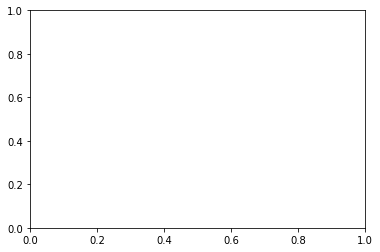

In [28]:
# plot is not happy
data.plot()

In [29]:
data.hvplot()

C:\Users\mmartini\AppData\Local\Continuum\Miniconda3\envs\IOOS3A\lib\site-packages\holoviews\core\data\xarray.py:259: FutureWarning: In the future, 'NAT < x' and 'x < NAT' will always be False.
  if ordered and data.shape and np.all(data[1:] < data[:-1]):
C:\Users\mmartini\AppData\Local\Continuum\Miniconda3\envs\IOOS3A\lib\site-packages\holoviews\core\data\xarray.py:259: FutureWarning: In the future, 'NAT < x' and 'x < NAT' will always be False.
  if ordered and data.shape and np.all(data[1:] < data[:-1]):
C:\Users\mmartini\AppData\Local\Continuum\Miniconda3\envs\IOOS3A\lib\site-packages\numpy\lib\arraysetops.py:285: FutureWarning: In the future, NAT != NAT will be True rather than False.
  mask[1:] = aux[1:] != aux[:-1]
C:\Users\mmartini\AppData\Local\Continuum\Miniconda3\envs\IOOS3A\lib\site-packages\holoviews\core\data\grid.py:269: FutureWarning: In the future, 'NAT < x' and 'x < NAT' will always be False.
  if np.all(coords[1:] < coords[:-1]):


:Image   [sample,time]   (P_1)

In [30]:
data[102,:].hvplot()

:Curve   [sample]   (P_1)

In [31]:
ds.close()